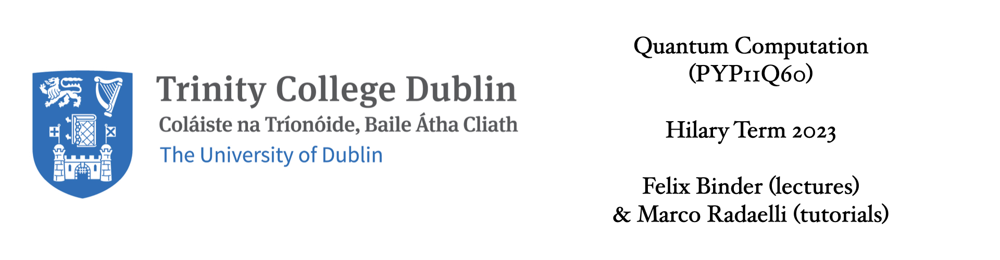

# Problem set 3

## General directions
<ul>
    <li>Some of the following exercises are numerical. They should be performed directly within this notebook. Other exercises are analytical, and should be solved on attached documents. You may submit handwritten solutions for the latter, but please make sure to write in a comprehensible manner.</li>
    <li>For the numerical tasks, please comment your code to explain what does what. Use meaningful names for variables and functions. </li>
    <li>We will need to be able to run the notebook. Make sure that there are no dependencies in the notebook based on files on your computer!</li>
    <li>Feel free to look online for help! Python documentation is <a href="https://docs.python.org/3/">here</a>, NumPy documentation <a href="https://numpy.org/doc/stable/">here</a>, and the Qiskit manual is <a href="https://qiskit.org/documentation/">here</a>. Some specific pages of Qiskit documentation or other useful sources are linked in the relevant questions.</li>
</ul>

$$\newcommand{\ket}[1]{\left|{#1}\right\rangle}$$
$$\newcommand{\bra}[1]{\left\langle{#1}\right|}$$
$$\newcommand{\braket}[2]{\left\langle{#1}\middle|{#2}\right\rangle}$$

# 3.0 - Dependencies
Please add all relevant dependencies for the problems to the following cell and avoid the <code>import</code> command elsewhere.

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from qiskit import *
from numpy.linalg import eig
import math
from qiskit.circuit.library.standard_gates import CPhaseGate, TGate, SGate, RZGate
import matplotlib.pyplot as plt 
from qiskit.visualization import plot_histogram
from numpy.random import randint


In [2]:
uni_sim = Aer.get_backend('unitary_simulator')
qasm = BasicAer.get_backend('qasm_simulator')
sim = Aer.get_backend('aer_simulator')

# 3.1 - Quantum Fourier Transform (3 pts.)

Consider the unitary operator $\mathcal{F}$ for the Quantum Fourier Transform (QFT)
$$\mathcal{F} \ket{j} = \frac{1}{\sqrt{N}}\sum_{k=0}^{N-1} e^{2\pi i j k /N}\ket{k}.$$
<ol>
    <li>Compute explicitly the Fourier transform on the $n$ qubits state $\ket{0\ldots 0}$</li>
    <li>We already know a quantum circuit for $\mathcal{F}$ from the lectures. In Qiskit, create that circuit for 5 qubits, and transform it into a gate using the appropriate functions.</li>
        <li>Give a quantum circuit for the inverse Quantum Fourier Transform (i.e., for the operator $\mathcal{F}^\dagger$) on 5 qubits. Create that circuit in Qiskit and also transform it into a gate.</li>
    <li>Again using Qiskit, create the circuits $\mathcal{F}\mathcal{F}^\dagger$ and $\mathcal{F}^\dagger\mathcal{F}$. Obtain the matrix representation of the two circuits, and show that it is equal to the identity in both cases.</li>
</ol>

### Part 1  
$ \ket{0}^{\otimes n} \rightarrow \sum_{k=0}^{N-1} e^{2 \pi i j k / 2^{n}} \ket{k} $ 
  
  
As $ \ket{j} = \ket{0}^{\otimes n}  $  

$ F \ket{0}^{\otimes n}= \frac{1}{2^{n/2}} \sum_{k=0}^{N-1} \ket{k}  $


### Part 2 : QFT circuit  
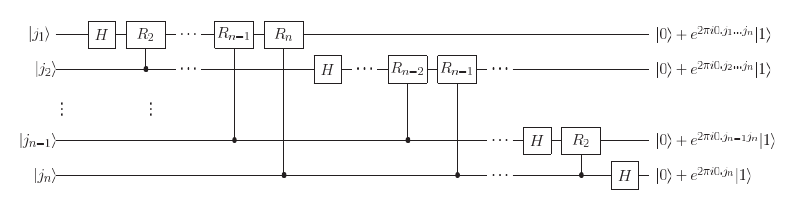

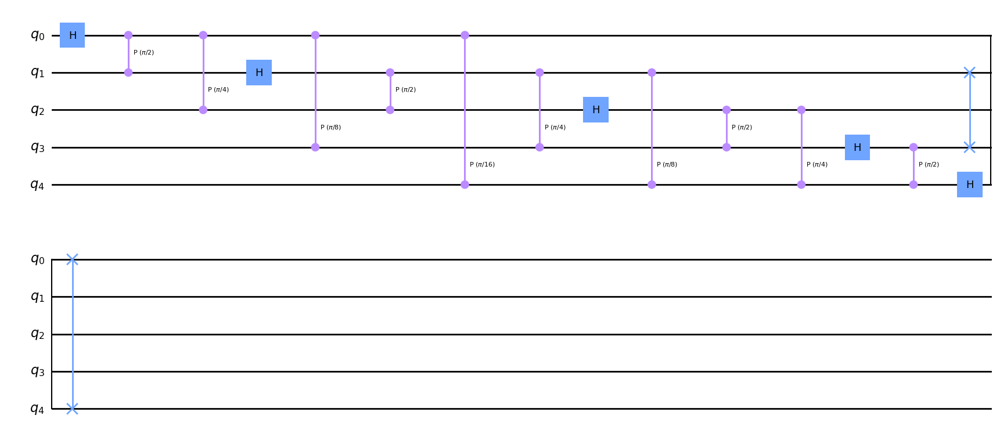

In [3]:
#Part 2 
''' 
Building QFT circuit in qiskit taking the above circuit as reference. Source : Nielsen and Chuang 

Note that we'll use swap gates at the ned to reverse the order of the qubits. 

''' 
n = 5
def qft(n) : 
    qft = QuantumCircuit(n)
    for qubit in range(n) : 
        qft.h(qubit)                      #step 1 : putting hadamard on every qubit
        for ctrl in range(qubit+1,n) : 
            qft.cp(np.pi/2**(ctrl-qubit),ctrl, qubit)    #step 2 Controlled rotations with phase 2*pi*i/2^k 
        #qft.barrier()                    #uncomment to see if the rotations are added on the correct registers 

    for reg in range(int(n/2)) : 
        qft.swap(reg, n-reg-1)            #reversing order of qubits
    #print(qft)
    qft_gate = qft.to_gate(label = 'F')   #converting qft circuit to gate 
    return qft_gate, qft
qft(n)[1].draw(output='mpl')

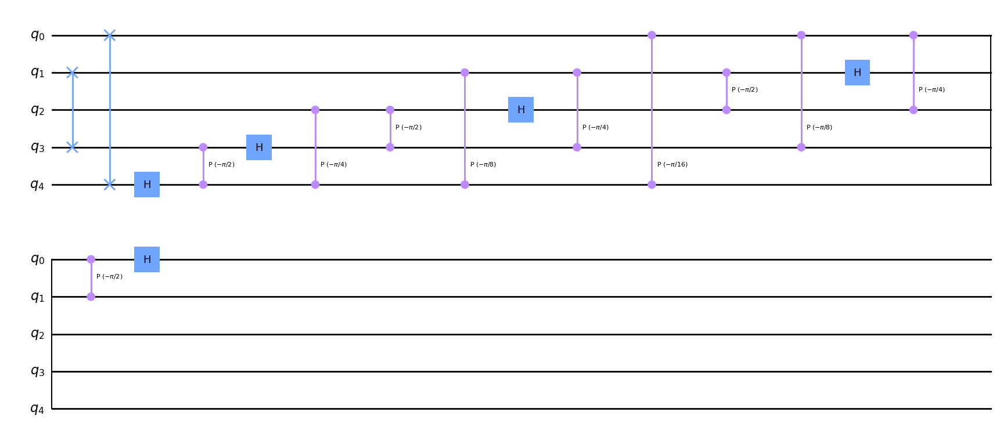

In [4]:
#Part 3 
def qft_dg(n) : 
    qft_dg = qft(n)[1].inverse()     #qft dagger is just the inverse of qft circuit
    #print(qft_dg)
    

    qft_dg_gate = qft_dg.to_gate(label = 'F$\dagger$')     #making qft dagger gate
    return qft_dg_gate, qft_dg
qft_dg(n)[1].draw(output='mpl')

In [5]:
#Part 4
FFdg = QuantumCircuit(n)               #defining F * F_dagger circuit
FFdg.append(qft(n)[1], range(n))
FFdg.append(qft_dg(n)[1], range(n))

job1 = execute(FFdg, uni_sim)                         #executing circuit on backend defined above
result1 = job1.result()                              #extracting result from the backend simulation
matrix1 = result1.get_unitary(FFdg, decimals=3)      #extracting unitary matrix of the cirucit from the result
print("Matrix obtained from FFdg circuit : \n", matrix1)
print('--------------------------------------------------------------------')

FdgF = QuantumCircuit(n)                #defining F_dagger * F circuit
FdgF.append(qft_dg(n)[1], range(n))
FdgF.append(qft(n)[1], range(n))

job2 = execute(FdgF, uni_sim)                         #executing circuit on backend defined above
result2 = job2.result()                              #extracting result from the backend simulation
matrix2 = result2.get_unitary(FdgF, decimals=3)      #extracting unitary matrix of the cirucit from the result
print("Matrix obtained from FdgF circuit : \n", matrix2)
print('--------------------------------------------------------------------')

if np.all(matrix1) == np.all(np.identity(n, dtype=complex)) == np.all(matrix2) :    #checking if both the matrices are identity
    print("Success! Both the matrices are identity")


Matrix obtained from FFdg circuit : 
 Operator([[ 1.-0.j, -0.+0.j, -0.+0.j, ..., -0.+0.j, -0.+0.j,  0.+0.j],
          [-0.+0.j,  1.-0.j,  0.+0.j, ..., -0.+0.j,  0.+0.j, -0.+0.j],
          [ 0.+0.j, -0.+0.j,  1.-0.j, ..., -0.+0.j, -0.+0.j,  0.+0.j],
          ...,
          [-0.+0.j,  0.+0.j, -0.+0.j, ...,  1.-0.j,  0.+0.j, -0.-0.j],
          [-0.+0.j, -0.-0.j,  0.+0.j, ..., -0.+0.j,  1.-0.j, -0.+0.j],
          [-0.-0.j, -0.+0.j, -0.+0.j, ...,  0.+0.j, -0.+0.j,  1.-0.j]],
         input_dims=(2, 2, 2, 2, 2), output_dims=(2, 2, 2, 2, 2))
--------------------------------------------------------------------
Matrix obtained from FdgF circuit : 
 Operator([[ 1.-0.j, -0.+0.j,  0.+0.j, ...,  0.+0.j,  0.+0.j,  0.+0.j],
          [-0.+0.j,  1.-0.j, -0.+0.j, ...,  0.+0.j,  0.+0.j,  0.+0.j],
          [-0.+0.j,  0.+0.j,  1.-0.j, ...,  0.+0.j,  0.+0.j,  0.+0.j],
          ...,
          [ 0.+0.j,  0.+0.j,  0.+0.j, ...,  1.-0.j, -0.+0.j, -0.+0.j],
          [ 0.+0.j,  0.+0.j,  0.+0.j, ..., -0.+0

# 3.2 - Quantum Phase Estimation (8 pts. total)

## 3.2.a Qiskit code /1 (4 pts.)

<ol>
    <li>In Qiskit, create the quantum circuit for quantum phase estimation of a <code>T-gate</code>. How many qubits do you need to consider to obtain an exact value for the phase for the eigenstate $\ket{0}$? How many for the eigenstate $\ket{1}$?</li>
    <li>Create a complete Python function <code>phase_estimation(oracle, eigenstate, number_qubits)</code> which performs the phase estimation for a generic oracle <code>oracle</code> on the eigenstate <code>eigenstate</code>, employing <code>number_qubits</code> qubits. The function should perform a quantum simulation, and return the estimated value of the phase (i.e., to bit-precision of <code>number_qubits</code>). Apply the function to the <code>T-gate</code> of the previous exercise, and verify that it works as expected.</li>
    <li>Now, run the function with a different oracle, given by $R_z\left(\frac{1}{3}\right)$. What happens?</li>
    <li>In a graph, plot the highest-probability result obtained for the phase estimation of $R_z\left(\frac{1}{3}\right)$, as a function of the number of employed qubits <code>number_qubits</code>.</li>
</ol>

### Part 1  
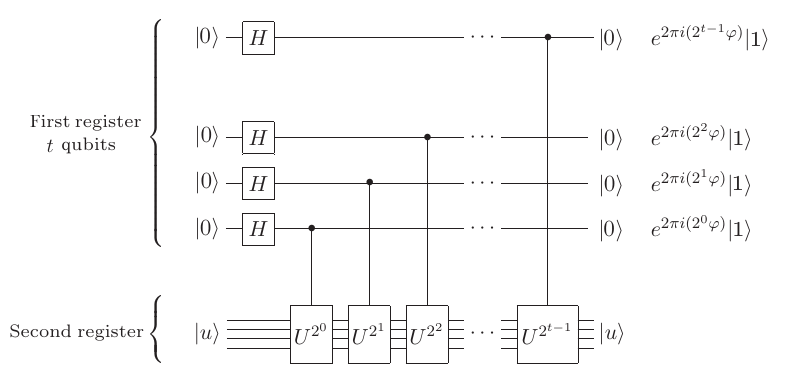

0.125
{'100': 1000}


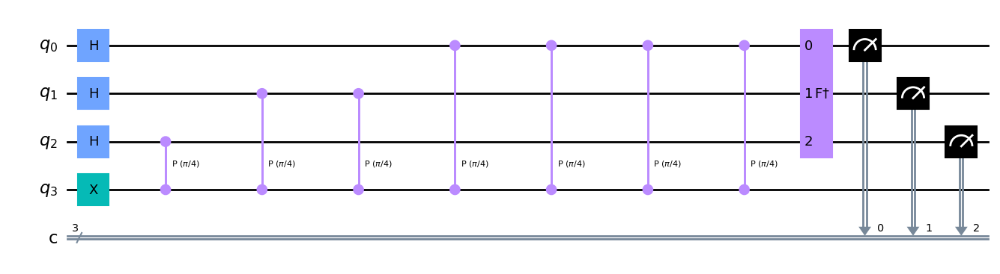

In [6]:
#Part 1
''' 
Building qpe circuit with above image as reference. Source : Nielsen and Chuang.  

We aim to find phi in e^(2*pi*phi*i) which is the eigenvalue of the operator U, 
on which the QPE is applied 

Note that we need to add QFT_dg at the end, on the t qubits, to get the value of phi on the output register

''' 
#we should receive phi = 0.125 at the end. We can represent this in 3 qubits, therefore t = 3
t = 3                          #Number of qubits to store information on phi
n = 1                          #Number of qubits needed to represnet eigenstate of the operator U 

qpe = QuantumCircuit(t+n,t) 
qpe.h(range(t))                #Step 1 

eig_state = 1                  #variable to decide eigenstate on last qubit               

if eig_state == 1 : 
    qpe.x(t)          #X gate to initialise last qubit with state |1>. Put eig_state = 0 to get phi corresponding to |0> state

rep = 0                        #varibale to store the number of times a rotation gate is tot be applied 
for ctrl in range(t-1,-1,-1) : 
    for itr in range(2**rep) : 
        qpe.cp(np.pi/4, ctrl, t )    
    rep += 1
    #qpe.barrier()             #uncomment to see if the rotations are applied on the correct qubits
    
qpe.append(qft_dg(t)[0], range(t))    #adding qft_dg from gate defined before 
qpe.measure(range(t),range(t))

#running circuit on backend 
result_qpe = execute(qpe, backend = qasm, shots = 1000).result()
counts_qpe = result_qpe.get_counts()
for i in counts_qpe :          #i is the binary value of the output state
    meas_res = i 

binary = 0
for i in range(t) :            #loop to convert the measurement result into decimal fraction
    binary += 1/(2 **(t-i)) * int(meas_res[i])
print(binary)  
print(counts_qpe)

qpe.draw(output='mpl')

As $ \phi = 0.125 $ for eigenstate $ \ket{1} $ and $ \phi = 0.0 $ for eigenstate $\ket{0}$ , we require t = 3 qubits and t = 1 qubit to find their exact phase respectively. 

In [7]:
#Part 2
''' 
Assuming a unitary oracle of any dimension, we'll build the circuit accordingly. 
We'll find the eigenstates of this U and assign it to the lower register. 

t implies number of qubits to store phi. We'll increase it to increase precision. 
''' 
def phase_estimation(oracle, eig_state, t) :
    num_shots = 100      #number of times a circuit will be run and measured. Increase this to get better probability results.
    n = int(math.log(len(eig_state))/math.log(2))  #number of qubits required to store eigenstate log2(2^n)
    qpe = QuantumCircuit(t+n,t)                    #t+n quantum registers. t classical registers to store phi
    
    #Step 1
    qpe.initialize(eig_state, t+n-1)               #initialising last register with eigenstate of U (oracle)
    qpe.h(range(t))
    
    #Step 2
    rep = 0
    for ctrl in range(t-1,-1,-1) :        #putting rotation gates as described in figure attache din part 1
        for itr in range(2**rep) : 
            control = [ctrl]              #control qubit, goes from last qubit to 1st qubit in t register
            target = list(range(t,t+n))   #target is the register containing eigenstate
            reg = control + (target)      #list of qubits on which the custom control_U gate would be appended
            qpe.append(oracle,reg)
        rep += 1
        qpe.barrier()
    
    #Step 3  
    qpe.append(qft_dg(t)[0], range(t))    #Add qft dagger on t qubits
    qpe.measure(range(t),range(t))        #measuring first t qubits
    #print("Final circuit : \n", qpe)
    result_qpe = execute(qpe, backend = qasm, shots = num_shots).result()
    counts_qpe = result_qpe.get_counts()
    print("Measurement result : ", counts_qpe)

    meas_res = max(counts_qpe, key = counts_qpe.get)     #getting the binary string of the state with highest frequency 
    freq = counts_qpe[meas_res]                          #freq = number of times this state appeared
    prob = int(freq)/num_shots                      
    print("State with maximum frequency : ", meas_res)
    print("Number of times this state was measured :", freq)
    print("Prob with which this state occurs :", prob)
    binary = 0
    for i in range(t) :                                   #converting the binary string to decimal fraction
        binary += 1/(2**(t-i)) * int(meas_res[i])
    print("--------------------------------------------------")

    return binary, prob
    
    

In [8]:
#Part 2 
gate = TGate()                    #can change the gate and try with other gates, for example : SGate (already imported)
oracle = gate.control(1)          #controlled U gate with one control
oracle_matrix = gate.to_matrix()  #getting matrix of the gate to find its eigenstate
eigenstate = eig(oracle_matrix)[1][1]  #using the second of all the eigenstates
#print(eig_state)
num_qubits = 3                #using 3 qubits because of T gate. Can try with more than 3 qubits

phase = phase_estimation(oracle, eigenstate, num_qubits)
print("Phase : ", phase)

Measurement result :  {'100': 100}
State with maximum frequency :  100
Number of times this state was measured : 100
Prob with which this state occurs : 1.0
--------------------------------------------------
Phase :  (0.125, 1.0)


### Part 3  
\begin{split}RZ(\lambda) = \exp\left(-i\frac{\lambda}{2}Z\right) =
    \begin{pmatrix}
        e^{-i\frac{\lambda}{2}} & 0 \\
        0 & e^{i\frac{\lambda}{2}}
    \end{pmatrix}\end{split}  

For $ \lambda = \frac{1}{3} $, eigenvalues = $ e^{\frac{i}{6}} , e^{{\frac{-i}{6}}} $  

  
$ \implies 2 \pi i \phi = \frac{i}{6} $  
$ \implies \phi = \frac{1}{12 \pi}  $ 

In [9]:
print("phi =", 1/(12*np.pi))

phi = 0.026525823848649224


- We can see that the phase is irrational and cannot be measured precisely. In such cases, we can increase the number of qubits to increase precision.  
- It was also noticed that more than one state appears in the measurement results. Therefore, we take state which has the highest probability of occuring. 

In [10]:
#Part 3
gate = RZGate(1/3)
oracle = gate.control(1)
oracle_matrix = gate.to_matrix()
print(eig(oracle_matrix))
eigenstate = eig(oracle_matrix)[1][1]  
#print(eig_state)
num_qubits = 10    
#can change num_qubits to get more/less precision. Can also change num of shots phase_estimation for faster executions 
print(phase_estimation(oracle, eigenstate, num_qubits))

(array([0.98614323-0.16589613j, 0.98614323+0.16589613j]), array([[1.+0.j, 0.+0.j],
       [0.+0.j, 1.+0.j]]))
Measurement result :  {'1101100000': 92, '0011100000': 4, '0101100000': 3, '1000010000': 1}
State with maximum frequency :  1101100000
Number of times this state was measured : 92
Prob with which this state occurs : 0.92
--------------------------------------------------
(0.0263671875, 0.92)


In [11]:
qubits = 10
x = range(1,qubits)
y = []
for i in x : 
    y.append(phase_estimation(oracle, eigenstate, qubits)[1])   #list that contains phases corresponding to number of qubits
print(x)
print(y)



Measurement result :  {'1101100000': 92, '0101100000': 3, '1100010000': 1, '0011100000': 3, '1001100000': 1}
State with maximum frequency :  1101100000
Number of times this state was measured : 92
Prob with which this state occurs : 0.92
--------------------------------------------------
Measurement result :  {'1101100000': 93, '0011100000': 3, '0101100000': 2, '1001100000': 1, '1011100000': 1}
State with maximum frequency :  1101100000
Number of times this state was measured : 93
Prob with which this state occurs : 0.93
--------------------------------------------------
Measurement result :  {'1101100000': 88, '0011100000': 3, '1001100000': 1, '0101100000': 4, '0001100000': 1, '0110000000': 1, '1110100000': 1, '1011100000': 1}
State with maximum frequency :  1101100000
Number of times this state was measured : 88
Prob with which this state occurs : 0.88
--------------------------------------------------
Measurement result :  {'1101100000': 96, '0011100000': 2, '0101100000': 1, '011110

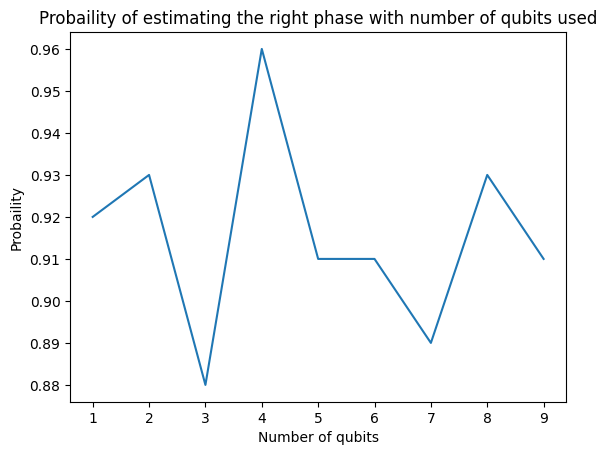

In [12]:
plt.plot(x,y)
plt.xlabel('Number of qubits')

plt.ylabel('Probaility')
  
# giving a title to my graph
plt.title('Probaility of estimating the right phase with number of qubits used')
  
# function to show the plot
plt.show()

- Varying number of qubits affects the precision with which we achieve $ \phi $ and the probability with which we achieve the state corresponding to the correct $ \phi $ .   
- On applying QPE to $ R_{y}(\frac{1}{3}) $ we observed that states other than the state of our interest also appeared in measurement results.  
- By taking more number of qubits we were able to increase the precision of the result. And by taking a suitable number of qubits, we were able to increase the probability of the occurance of the correct state. 

## 3.2.b Analytical treatment of the error (4 pts.)
After the controlled application of the oracle, but before the final QFT, the state of the first $m$-qubit register is:
$$\ket{\theta} = \frac{1}{2^m} \sum_{k=0}^{2^m-1} e^{2\pi i k \theta} \ket{k}$$
where $\theta$ is the parameter to be estimated. 

<ol>
    <li>Apply the QFT to $\ket{\theta}$, and give an analytical expression for the output state.</li>
    <li>Determine the probability to obtain an outcome $j \in \{0,\ldots,2^m-1\}$ when performing the measurement.</li>
    <li>Show that, if there exists a $j=\tilde{j}$ such that $\theta=\frac{\tilde{j}}{2^m}$ (i.e., $\theta$ has an exact representation in $m$ bits), then the outcome of the measurement is $j$ with unit probability.</li>
    <li>If this is not the case, let $j^*$ be the specific value of $j$ which gives the best estimate $\frac{j^*}{2^m}$ of $\theta$. In other words, it should be true that $\theta = \frac{j}{2^m} +\varepsilon$, where $|\varepsilon| < 2^{-(m+1)}$. Prove that the probability of getting the outcome $j^*$ for the measurement is larger than $\frac{4}{\pi^2}$. </li>
</ol>

<b>Hint.</b> The following inequalities are given:
$$\frac{2\pi |\varepsilon| 2^m}{|e^{2\pi i \varepsilon 2^m}-1|}\leq \frac{\pi}{2}$$ <br>
$$|e^{2\pi i \varepsilon} - 1| \leq 2\pi |\varepsilon|$$

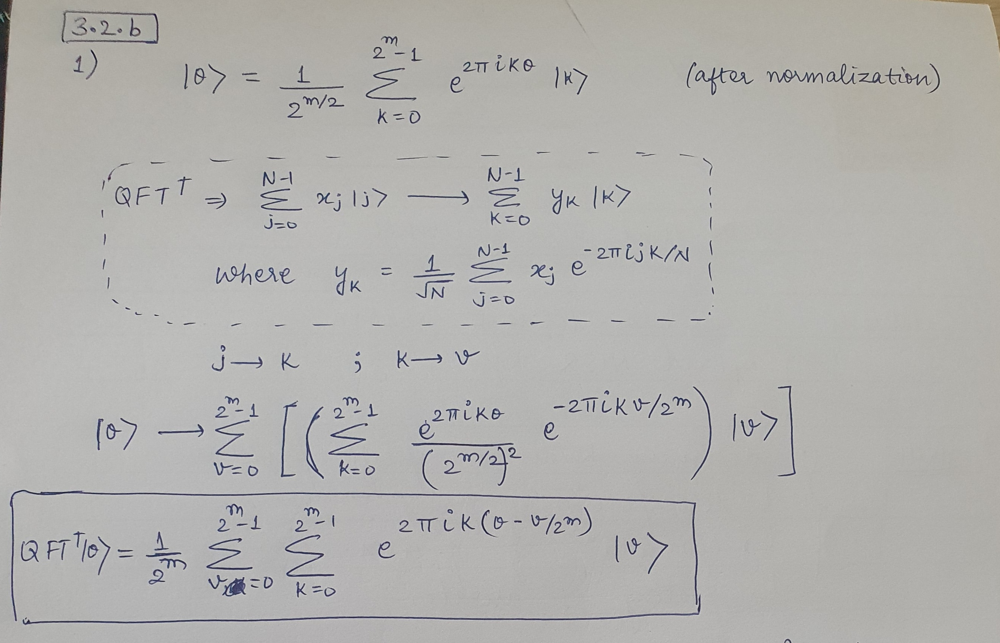

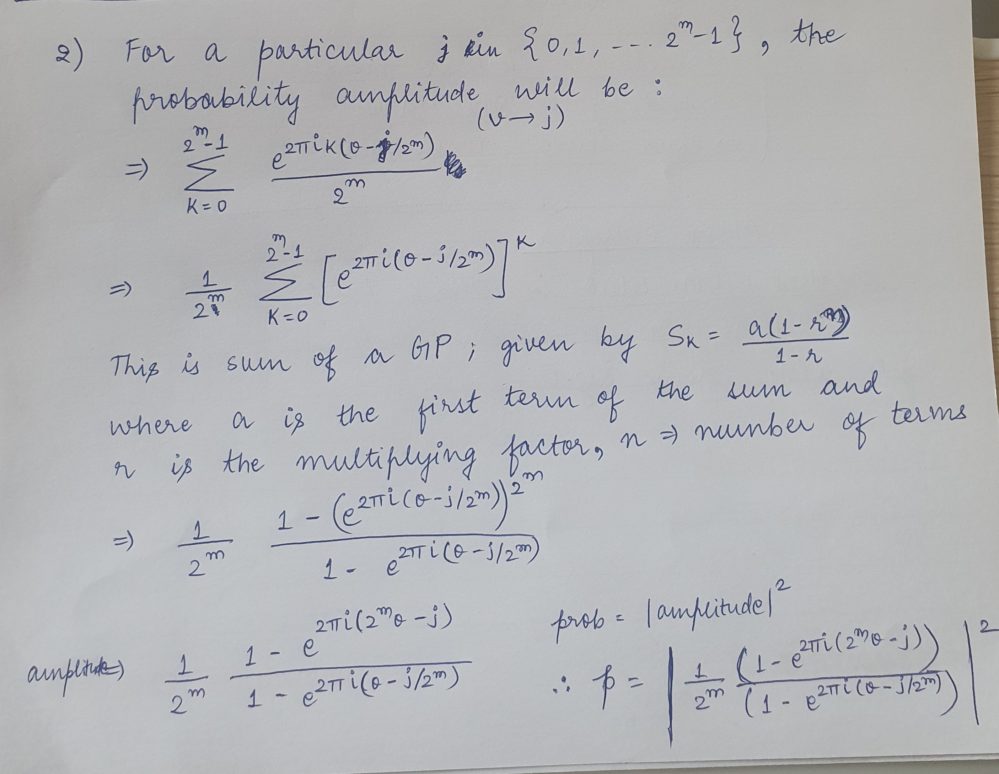

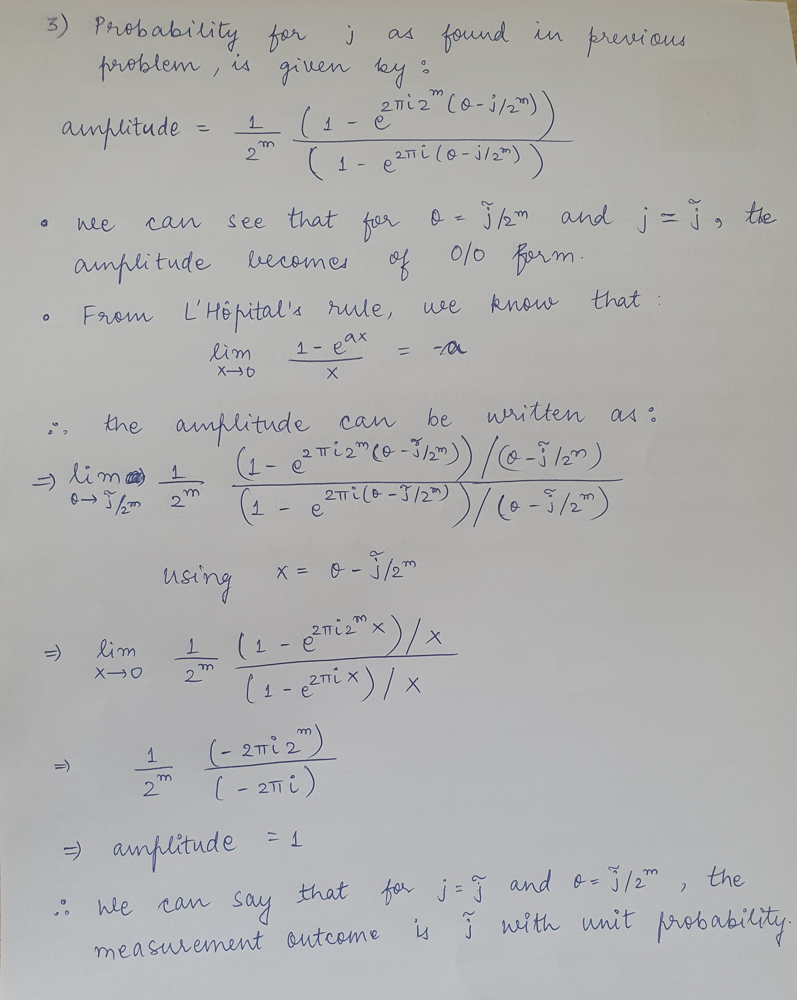

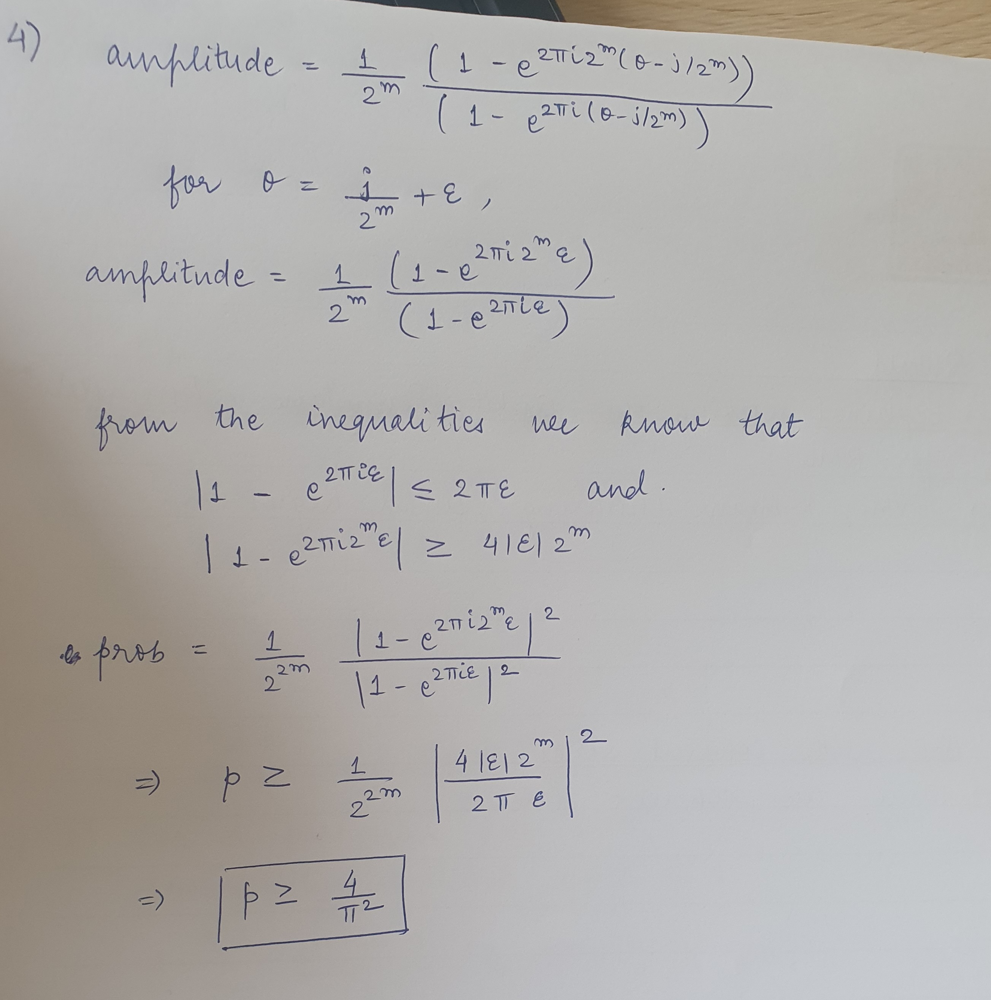

# 3.3 - Period finding (8 pts. total)
Consider a function $f:\mathbb{Z}_N\to C$, where $C$ is a finite set of values. Suppose that $f$ is known to be periodic; namely:
$$\exists s \in Z_N - \{0\} \mbox{ s.t. } f(x+s)=f(x)\,\,\,\, \forall x \in Z_N$$
Furthermore, in each period, each symbol appears only once.
The goal of this problem is to obtain $s$. For the sake of simplicity, assume $N = 2^n$ for some $n$.

## 3.3.a Classical version (2 pt.)
<ol>
  <li>Show that the periodicity condition implies that $s$ divides $N$. </li>
  <li>Show that the problem can be solved on a classical calculator with $\mathcal{O}(n)$ evaluations of the function $f$, where $n = \log_2 N$.  </li>
</ol>

### 3.3.a.1  
- Suppose for contradiction that $s$ does not divide $N$. Then we can write $N = qs + r$ for some $q \in \mathbb{Z}$ and $0 < r < s$.   
- We know that we can write :  $ f(x) = f(x+qs) $   
$ \implies f(x) = f(x+N-r) $  
- As $ (N - r) $  is not a period of $f(x)$ , this contradicts the fact that each output appears only once in a period. Therefore, N has to be a multiple of s. 

### 3.3.a.2  
- To find s, we can query each element in $ Z_{N} $ one by one and find out the period. This implies that we need $ O(num-elements) $ evaluations. The number of elements in $ Z_{N} $ is equal to $ log_{2}N $ which is given to be equal to n. Therefore, we will need $ O(n) $ evaluations to solve this problem. 

## 3.3.b Quantum protocol (3 pts.)
Consider an oracle $O_f$, acting as follows:
$$O_f(\ket{x}\ket{b}) = \ket{x}\ket{b\oplus f(x)}$$
where $b$ is a string of length $m$, and $\oplus$ represents the sum modulus $2^m$. Consider the following protocol:
<ul>
  <li>Prepare the state 
    $$\frac{1}{\sqrt{N}} \sum_{x\in Z_N} \ket{x}$$
    These first qubits constitute the <b>first register</b>.
  </li>
  <li> Attach a <b>second register</b> in state $\ket{0^m}$.</li>
  <li> Query the oracle $O_f$ on the current input.</li>
  <li> Measure the second register in the computational basis.</li>
  <li> Apply the QFT to the first register.</li> 
  <li> Measure the first register. </li>
</ul>

<ol>
  <li>Let $c \in C$ be fixed. Show that the probability of obtaining $c$ as measurement outcome on the second register is $\frac{1}{s}$.</li>
  <li>Write the state of the first register after having obtained measuremetn outcome $c$ on the second register.</li>
</ol>

<b>Hint.</b> You may find it use useful to define the auxiliary function 
$$f_c(x) = \begin{cases}1 & \mbox{ if } f(x)=c \\ 0 & \mbox { otherwise}\end{cases}$$

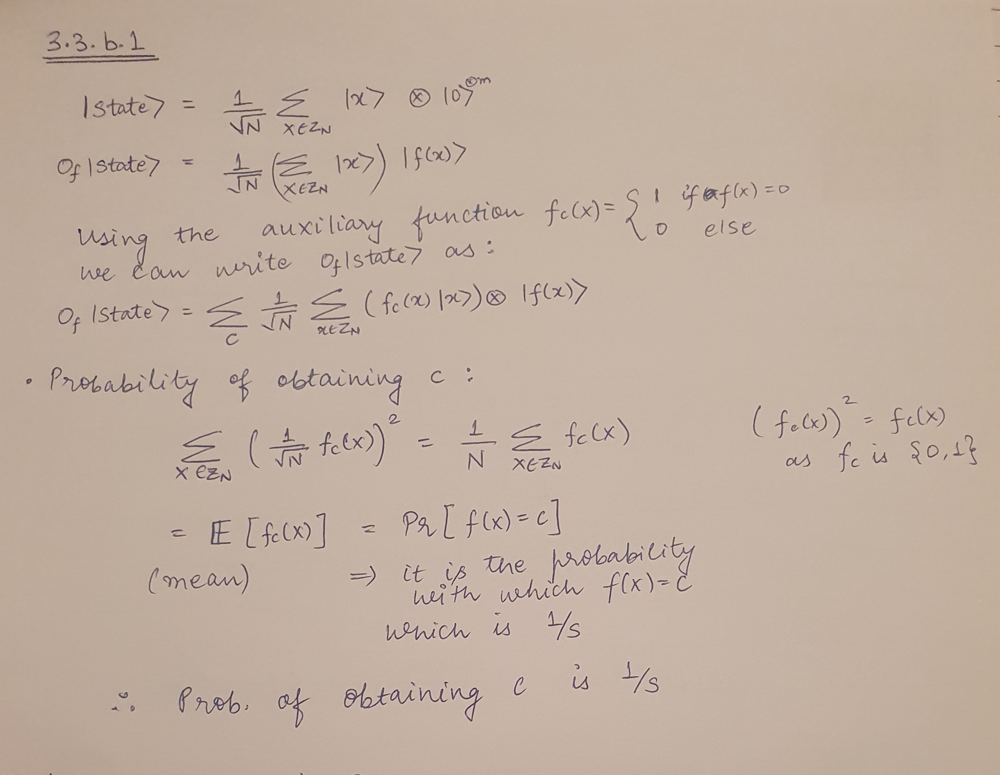

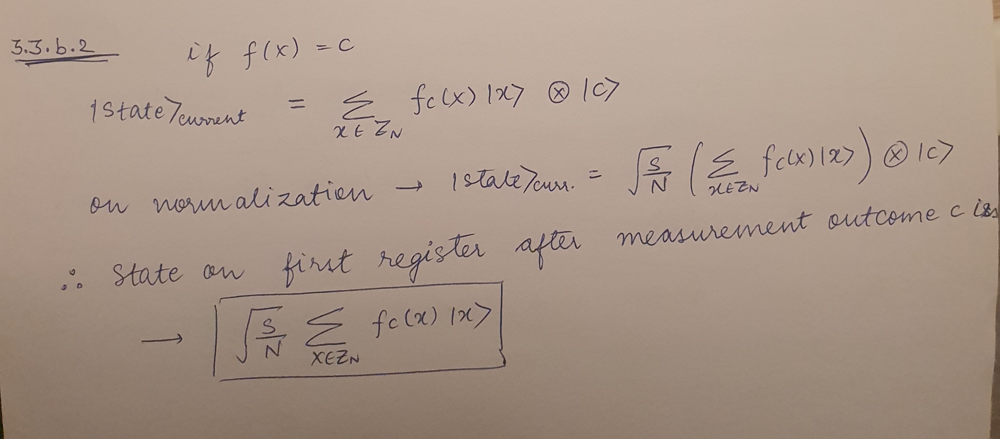

## 3.3.c The Fourier coefficients /1 (1 pt.)
Consider a function $g: \mathbb{Z}_N \to C$ and a number $t \in \mathbb{Z}_N$. Let $k: \mathbb{Z}_N \to C$ be another function such that $k(x) = g(x+t)$. Show that $g$ and $k$ have the same Fourier coefficients, except for a multiplicative factor of absolute value 1.

Notice that it follows that the measurement outcome on the first register does not depend on the $c$ we measured on the second register. Without loss of generality, we can hence assume to have measured $f(0)=c$. Therefore:
$$f_c(x)=\begin{cases}1 & \mbox{ if } x=0,s,2s,\ldots \\ 0 & \mbox{ otherwise}\end{cases}$$

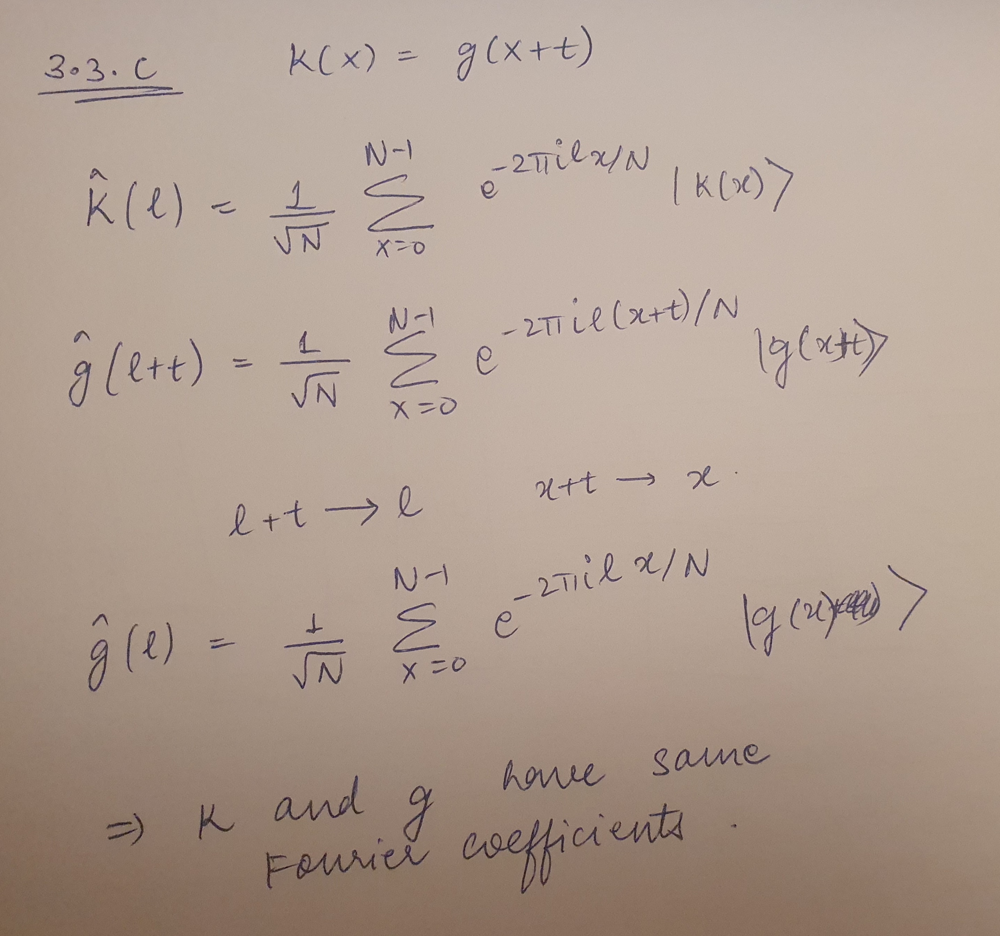

## 3.3.d The Fourier coefficients /2 (1 pt.)
Prove that $f_c(x)$ defined in this way has Fourier coefficients given by:
$$\hat{f_c}(\gamma) = \begin{cases}\frac{1}{s} & \mbox{ if } \gamma \in \{0, N/s, 2N/s,\ldots\} \\ 0 & \mbox{ otherwise}\end{cases}$$

It follows that, when performing the measurement on the first register, we are sampling uniformly a value of $\gamma$ from the set $\{0, N/s, 2N/s, \ldots \}$, or equivalently from the $\gamma$ values such that $\gamma s =0 \mod N$.

## 3.3.e Finding the period (1 pt.)
Describe how the measurement outcomes obtained from the measurement on the first register can be used to find the period of the function $f$.

- On measuring the first register and then performing continued fractions algorithm will give us the period of the function $f$.   
- Before inverse fourier transform our state looks like this :  
$$ \frac{1}{\sqrt{2^{t}}} \sum_{x=0}^{2^{t}-1} \ket{x} \ket{f(x)} $$  
- On writing it in terms of $ \ket{\hat{f}(l)} $, we get :  
$$ \frac{1}{\sqrt{r2^{t}}} \sum_{l=0}^{r-1} \sum_{x=0}^{2^{t}-1} e^{2 \pi i l x /r} \ket{x} \ket{\hat{f}(l)} $$  
- On applying inverse fourier transform, it becomes :   
$$ \frac{1}{\sqrt{r}} \sum_{l=0}^{r-1} \tilde{\ket{l/r}} \ket{\hat{f}(l)} $$  
- on measuring the first register and on performing continuous fraction algorithm, we can get the period r from it. 

# 3.4 - Factoring (6 pts. total)
The aim of this exercise is to build a specific implementation of Shor's factoring algorithm, which will allow factorisation of the number $15$. 

## 3.4.a Classical auxiliary functions  (1 pt.)
First of all, some classical subroutines are required. Write the following Python functions:
<ol>
    <li> <code>gcd(x,y)</code>, which computes the greatest common divisor between the numbers <code>x</code> and <code>y</code>. </li>
    <li> <code>verify_factor(N,x)</code>, which verifies whether <code>x</code> is a factor of <code>N</code>. 
</ol>
Discuss the scaling of the computational complexity of the latter function in terms of the number of bits required to encode $N$ and in reference to the complexity class *NP*.

In [13]:
def gcd(x,y) : 
    for i in range(min(x,y), 0, -1) : 
        if x%i == 0 and y%i == 0 : 
            gcd = i 
            break 
        else :
            pass 
    return gcd 
    
def verify_factor(N,x) : 
    if N % x == 0 : 
        value = True
    else : 
        value = False 
    return value


## 3.4.b Classical period finding (1 pt.)
Consider the function
$$f(x) = a^x \mod N$$
where $a$, $x$ and $N$ are numbers in $\mathbb{N}$, and $a$ is prime. It can be shown that the function $f(x)$ is periodic, and that each value of $f(x)$ appears only once in each period.

Define a Python function <code>classical_period_find(a,N)</code> that computes the period of the function $f(x)$ of the form specified above, for given $a$ and $N$. Discuss the complexity of the function, in terms of the bits required to encode $N$.

Next, define a Python function <code>period_verify(a,N,p)</code>, which verifies whether the proposed $p$ is the correct period of $f(x)$. Discuss its complexity in terms of the bits required for encoding $N$. Discuss the relation between <code>classical_period_find</code> and <code>period_verify</code> in reference to the complexity class *NP*.

In [14]:
def classical_period_find(a,N) : 
    fx = []                       #list that contains values of fx for x ranging from 0 to r
    fx1 = (a**1) % N              #f(0)
    fx.append(fx1)                
    fx_new = (a ** 2) % N         #f corresponding to next x 
    x = 3                         #r f
    while fx_new not in fx : 
        fx.append(fx_new)
        fx_new = (a **x) % N 
        x += 1
    period = x - 2                #period = r 
    print("Period =",period)
    print("list of f(x)", fx)                   #list of all f(x)
    #print(fx_new)                #Halting fx_new. This should be equal to the first element in the list, f(0)
    return period 


def period_verify(a,N,p) : 
    flag = 0
    for x in range(1,p+1) : 
        # print("x", x)
        # print("1st",(a**x)%N)
        # print("2nd", (a**(x+p))%N)
        if (a**x) % N == (a**(x+p)) % N : 
            flag += 1 
            #print("flag :",flag)
        else : 
            pass 
    if flag == p : 
        val = True 
    else : 
        val = False 
    #print("final",flag)
    return val 

a = 7
N = 15
print(period_verify(a,N, classical_period_find(a,N) ))


Period = 4
list of f(x) [7, 4, 13, 1]
True


## 3.4.c Quantum period finding (2pt.)
For the specific case of $a=2$, $N=15$, write the Qiskit code for quantum period finding (Shor's algorithm). 

- Shor's algorithm suggests to apply Quantum Phase Estimation on $U$ such that $ U \ket{y} = \ket{ay \mod N} $  
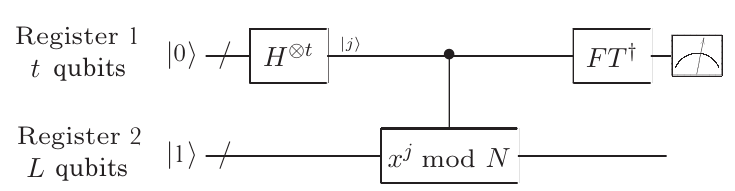

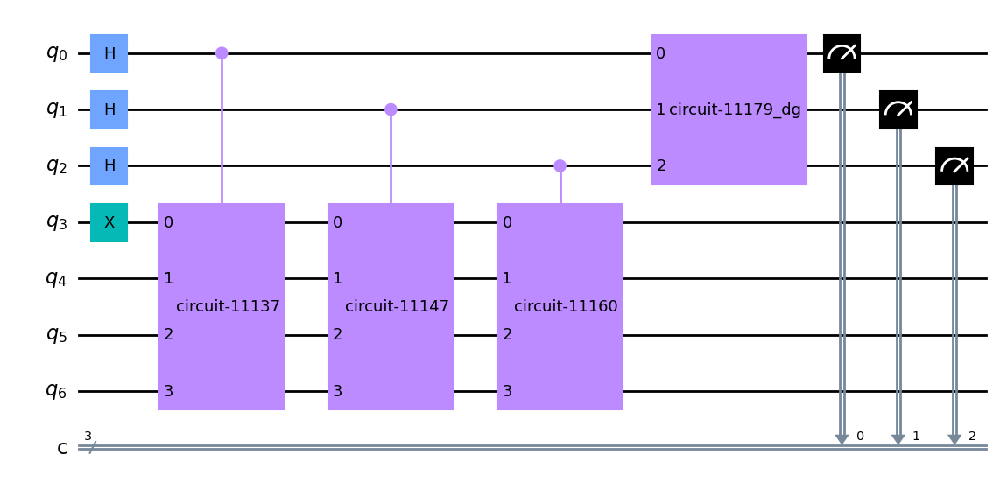

In [15]:
a = 2
N = 15 
def U_gate(a, n) : 
    #Making U for phase estimation, such that it follows the above equation. U|y> = |ay mod N> 
    U = QuantumCircuit(4)
    for i in range(n) : 
        U.swap(2,3)
        U.swap(1,2)
        U.swap(0,1)
    U = U.to_gate()
    c_U = U.control()
    return c_U

t = 3  # number of qubits on first register


# Initialising QuantumCircuit with t + 4 qubits for U to act on
qc = QuantumCircuit(t + 4, t)

#Step 1
for q in range(t):
    qc.h(q)
    
qc.x(t)               #auxiliary qubit in state |1>

# Step 2 : controlled rotations
for q in range(t):
    qc.append(U_gate(a, 2**q), 
             [q] + [i+t for i in range(4)])

# Step 3 : QFT dagger
qc.append(qft_dg(t)[1], range(t))

# Measure circuit
qc.measure(range(t), range(t))
qc.draw(output='mpl')  # -1 means 'do not fold' 

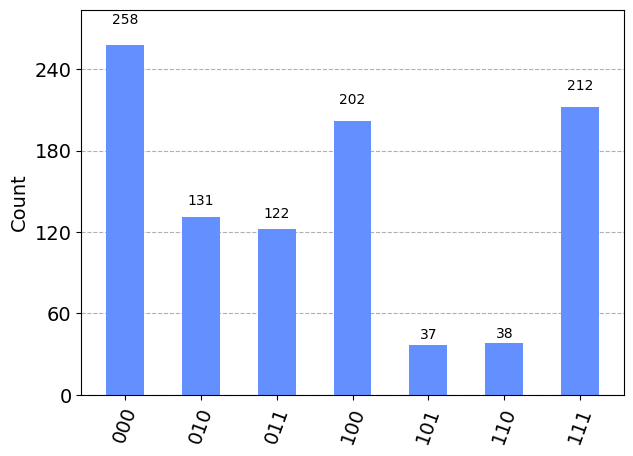

In [16]:
#plotting histogram of obtained results
results = execute(qc, backend = sim, shots = 1000).result()
counts = results.get_counts()
plot_histogram(counts)

In [17]:
#Only taking outcomes with higher frequency of occurence (Is more helpful when t is higher)
frequent_outcomes = []
for i in counts : 
    if counts[i] >= 50 : 
        frequent_outcomes.append(int(i,2))
print(frequent_outcomes)
        


[3, 4, 0, 7, 2]


Pass the most frequent outcomes to the following function, which estimates the compatible periods using a variant of the continuous-fractions algorithm. You can verify which one of the candidates is the correct period using the <code>period_verify</code> function.

In [18]:
def estimate_period(shor_result):
    res_range = 16
    
    if shor_result < res_range/2:
        shor_result = res_range - shor_result
        
    best_error = 1.
    e0 = 0
    e1 = 1
    e2 = 0
    
    actual = shor_result / res_range
    candidates = []
    
    for denominator in range(1, shor_result):
        numerator = round(denominator * actual)
        estimated = numerator / denominator 
        error = abs(estimated - actual)
        
        e0 = e1
        e1 = e2
        e2 = error
        
        if e1 <= best_error and e1 < e0 and e1 < e2:
            repeat_period = denominator - 1
            candidates.append(denominator - 1)
            best_error = e1
            
        if 0 in candidates:
            candidates.remove(0)
        
    return candidates


period_list = []
for i in frequent_outcomes : 
    candidates = estimate_period(i)
    
    for period in candidates : 
        if period_verify(a,N,period) == True : 
            period_list.append(period)
print(period_list)
            
    

[4, 8, 8]


## 3.4.d Prime factoring (1 pt.)
Now, use the function <code>gcd</code> to return the factorisation of the number $15$ from Shor's algorithm. If $p$ is the period of the function $f(x)$, then one of $N$'s prime factor might be given by 
$$\gcd\left(N, a^{p/2}+1\right)$$
or by
$$\gcd\left(N, a^{p/2}-1\right)$$

In [19]:
for period in period_list : 
    print(a,N,period)
    gcd1 = gcd(N, int(a**(period/2)+1))
    gcd2 = gcd(N, int(a**(period/2) - 1))
    
    print("period =", period)
    print("gcd 1 =", gcd1)
    print("gcd 2 =", gcd2)
    print("-------------------------")

2 15 4
period = 4
gcd 1 = 5
gcd 2 = 3
-------------------------
2 15 8
period = 8
gcd 1 = 1
gcd 2 = 15
-------------------------
2 15 8
period = 8
gcd 1 = 1
gcd 2 = 15
-------------------------


## 3.4.e Order finding and period finding (1 pt.)
In this exercise, you have built Shor's factorisation algorithm in a sligthly different way than in the class, based on the <b>period finding</b> rather than on the <b>order finding</b>.

Period finding, as discussed above, aims at finding the least positive $r$ such that:
$$f(x+r) = f(x) \,\,\,\,\, \forall x$$

Order finding considers a specific function of the form:
$$ f(x) = a^x \mod N$$
and aims at finding the least $x\neq 0$ such that $f(x) = 1$. 

Show that order finding is a subclass of period finding. 

### 3.4.e  
- Order finding is similar to period finding. It just uses a specific function, $f(x) = a ^{x} \mod N$ and aims to find the smallest period with the given constraints.   
- Period finding finds the least positive period of $f(x)$ without any other constraints. So, we can say that order finding is a specific case, hence a sub-class of period finding.  


### References :  
- Nielsend and Chuang  
- Qiskit Notebook  
- https://www.cs.cmu.edu/~odonnell/quantum15/lecture08.pdf